In [22]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("whitegrid")
plt.rcParams['text.usetex'] = True
%matplotlib inline

import numpy as np
import flash
from flash.text import TextClassificationData, TextEmbedder

import stanza
nlp = stanza.Pipeline(lang='en', processors='tokenize')

2023-01-31 15:35:47 INFO: Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES
2023-01-31 15:35:47 INFO: Loading these models for language: en (English):
| Processor | Package  |
------------------------
| tokenize  | combined |

2023-01-31 15:35:47 INFO: Use device: gpu
2023-01-31 15:35:47 INFO: Loading: tokenize
2023-01-31 15:35:47 INFO: Done loading processors!


In [23]:
# Read the data
datapath = "data/Harry_Potter_Corpora/Book1.txt"
with open(datapath, "r", encoding="utf8") as f:
    texts = f.read()

In [24]:
doc = nlp(texts)
len(doc.sentences)

6356

In [25]:
doc.sentences[3].text.replace("\n", "")
sentences = [sentence.text.replace("\n", "") for sentence in doc.sentences]
sentences[3]

'They were the last people you’d expect to be involved in anything strange or mysterious, because they just didn’t hold with such nonsense.'

In [26]:
# Wrapping the prediction data inside a datamodule
datamodule = TextClassificationData.from_lists(
    predict_data=sentences,
    batch_size=10,
)


In [27]:
model = TextEmbedder(backbone="sentence-transformers/all-MiniLM-L6-v2")

Using 'sentence-transformers/all-MiniLM-L6-v2' provided by Hugging Face/transformers (https://github.com/huggingface/transformers).
Using 'Pooling' provided by UKPLab/sentence-transformers (https://github.com/UKPLab/sentence-transformers).


In [28]:
trainer = flash.Trainer(gpus=0)

# Since this task is tackled unsupervised, the predict method generates sentence embeddings using the prediction input
embeddings = trainer.predict(model, datamodule=datamodule)
flatten_embeddings = np.array([item.numpy()
                              for sublist in embeddings for item in sublist])


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: /home/qtran/textvis/lightning_logs


Predicting DataLoader 0: 100%|██████████| 636/636 [02:23<00:00,  4.42it/s]


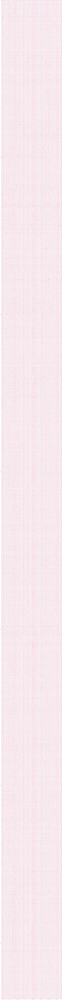

In [36]:
fig = plt.figure(figsize=(500, 500))
plt.imshow(flatten_embeddings, cmap=plt.cm.PiYG)